# Business Problem

- Business Case - In the recent past, the industry of wealth management has seen a lot of growth. Every individual or business actively searches for opportunities to get the maximum returns. However, in most of the cases, they either lack the skills to identify the right investment opportunity, or there is a shortage of time for finding these opportunities. Hence, this gave rise to the dedicated individuals who perform this task on behalf of the investors for a commission - Portfolio managers.​

- A portfolio manager makes investment decisions and carries out other related activities on behalf of vested investors. They work with a team of analysts and researchers, and their main objective is to realise the needs of the investor and suggest a suitable portfolio that meets all the expectations. They are responsible for establishing the best investment strategy, selecting appropriate investments along with the right allocation. However, in doing so, they face a lot of competition in the form of other portfolio managers and rival firms. Therefore, the portfolio manager has to use the available resources to provide the best solution to the investor.

# 1. Importing Required Libraries

In [1]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
pd.set_option('display.max_columns',200)
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set(style="ticks", color_codes=True)
import statsmodels.api as sm
from statsmodels.tsa.api import VAR
from sklearn.metrics import mean_squared_error

- Also import warnings for clear coding output.

## 1.1 Reading CSV files

In [2]:
# For S&P500
snp500 = pd.read_csv('S&P500.csv')

In [3]:
# For Technology 
apple = pd.read_csv('AAPL.csv')
amazon = pd.read_csv('AMZN.csv')
google = pd.read_csv('GOOG.csv')

In [4]:
#For Heathcare 
bausch_health_co = pd.read_csv('BHC.csv')
jonson_and_jonson = pd.read_csv('JNJ.csv')
merck_and_co = pd.read_csv('MRK.csv')

In [5]:
# For Avation 
american_airlines= pd.read_csv('AAL.csv')
alaska_air=pd.read_csv('ALK.csv')
hawaiian = pd.read_csv('HA.csv')

In [6]:
# For finance
credit_suisse = pd.read_csv('CS.csv')
deutsche_bank = pd.read_csv('DB.csv')
goldman_sachs = pd.read_csv('GS.csv')

# 2. Creating New Dataframe

## 2.1 We need Adj Close Value , Volume and Date from the give data sets

### 2.1.1 For Snp500

In [7]:
#creating data frame
Snp500_stock=pd.DataFrame()
# For Snp
Snp500_stock[['snp_Adj Close','snp_Volume','Date']]=snp500[['Adj Close','Volume','Date']].copy()

### 2.1.2 For Technology

In [8]:
# Creating data frame
apple_stock=pd.DataFrame()
amazon_stock=pd.DataFrame()
google_stock=pd.DataFrame()
#For the Technology 
apple_stock[['aapl_Adj Close','aapl_Volume','Date']]=apple[['Adj Close','Volume','Date']].copy()
amazon_stock[['amzn_Adj Close','amzn_Volume','Date']]=amazon[['Adj Close','Volume','Date']].copy()
google_stock[['goog_Adj Close','goog_Volume','Date']]=google[['Adj Close','Volume','Date']].copy()

In [9]:
#checking shape of Technology
Technology = list([apple_stock,amazon_stock,google_stock])
for frames in Technology:
    print(frames.shape)

(2517, 3)
(2524, 3)
(2524, 3)


In [10]:
#Dropping all the missing values in Technology 
for frames in Technology:
    frames.dropna(inplace=True)

In [11]:
#checking shape of Technology after droping
for frames in Technology:
    print(frames.shape)

(2517, 3)
(2517, 3)
(2517, 3)


### 2.1.3 For Healthcare

In [12]:
# Creating data frame
bausch_health_co_stock=pd.DataFrame()
jonson_and_jonson_stock=pd.DataFrame()
merck_and_co_stock=pd.DataFrame()
#For the Healthcare
bausch_health_co_stock[['bhc_Adj Close','bhc_Volume','Date']]=bausch_health_co[['Adj Close','Volume','Date']].copy()
jonson_and_jonson_stock[['jnj_Adj Close','jnj_Volume','Date']]=jonson_and_jonson[['Adj Close','Volume','Date']].copy()
merck_and_co_stock[['mrk_Adj Close','mrk_Volume','Date']]=merck_and_co[['Adj Close','Volume','Date']].copy()

In [13]:
#checking Shape of Healthcare
Healthcare = list([bausch_health_co_stock,jonson_and_jonson_stock,merck_and_co_stock])
for frames in Healthcare:
    print(frames.shape)

(2525, 3)
(2525, 3)
(2525, 3)


In [14]:
#Dropping all the missing values in Healthcare
for frames in Healthcare:
    frames.dropna(inplace=True)

In [15]:
#checking shape of Healthcare after droping
for frames in Healthcare:
    print(frames.shape)

(2517, 3)
(2517, 3)
(2517, 3)


### 2.1.4 For Aviation

In [16]:
# Creating data frame
american_airlines_stock=pd.DataFrame()
alaska_air_stock=pd.DataFrame()
hawaiian_stock=pd.DataFrame()
#For the aviation industry
american_airlines_stock[['aal_Adj Close','aal_Volume','Date']]=american_airlines[['Adj Close','Volume','Date']].copy()
alaska_air_stock[['alk_Adj Close','alk_Volume','Date']]=alaska_air[['Adj Close','Volume','Date']].copy()
hawaiian_stock[['ha_Adj Close','ha_Volume','Date']]=hawaiian[['Adj Close','Volume','Date']].copy()

In [17]:
Avation = list([american_airlines_stock,alaska_air_stock,hawaiian_stock])
for frames in Avation:
    print(frames.shape)

(2517, 3)
(2524, 3)
(2524, 3)


In [18]:
#Dropping all the missing values in Avation
for frames in Avation:
    frames.dropna(inplace=True)

In [19]:
#checking shape of Avation  after droping
for frames in Avation:
    print(frames.shape)

(2517, 3)
(2517, 3)
(2517, 3)


### 2.1.5 For Finance

In [20]:
# Creating data frame
credit_suisse_stock=pd.DataFrame()
deutsche_bank_stock=pd.DataFrame()
goldman_sachs_stock=pd.DataFrame()
#For the Finance
credit_suisse_stock[['cs_Adj Close','cs_Volume','Date']]=credit_suisse[['Adj Close','Volume','Date']].copy()
deutsche_bank_stock[['db_Adj Close','db_Volume','Date']]=deutsche_bank[['Adj Close','Volume','Date']].copy()
goldman_sachs_stock[['gs_Adj Close','gs_Volume','Date']]=goldman_sachs[['Adj Close','Volume','Date']].copy()

In [21]:
#checking Shape of Finance
Finance = list([credit_suisse_stock,deutsche_bank_stock,goldman_sachs_stock])
for frames in Finance:
    print(frames.shape)

(2712, 3)
(2712, 3)
(2712, 3)


In [22]:
#Dropping all the missing values in Finance
for frames in Finance:
    frames.dropna(inplace=True)

In [23]:
#checking shape of Finance after droping
for frames in Finance:
    print(frames.shape)

(2705, 3)
(2705, 3)
(2705, 3)


In [24]:
stock = list([american_airlines_stock,alaska_air_stock,hawaiian_stock,credit_suisse_stock,deutsche_bank_stock,goldman_sachs_stock,
             bausch_health_co_stock,jonson_and_jonson_stock,merck_and_co_stock,apple_stock,google_stock,amazon_stock,Snp500_stock])

# 3. Data Exploration

## 3.1 import library

In [25]:
import math
from functools import reduce

## 3.2 Now Merging All The Dataframes by the help of The Reduce Function 

In [26]:
final_stock = reduce(lambda left,right:pd.merge(left,right,on=['Date'],how='inner'),stock)
final_stock.set_index(['Date'],inplace=True)

### 3.2.1 Checking head and Columns of Final Stock

In [27]:
final_stock.head()

,aal_Adj Close,aal_Volume,alk_Adj Close,alk_Volume,ha_Adj Close,ha_Volume,cs_Adj Close,cs_Volume,db_Adj Close,db_Volume,gs_Adj Close,gs_Volume,bhc_Adj Close,bhc_Volume,jnj_Adj Close,jnj_Volume,mrk_Adj Close,mrk_Volume,aapl_Adj Close,aapl_Volume,goog_Adj Close,goog_Volume,amzn_Adj Close,amzn_Volume,snp_Adj Close,snp_Volume
Date,,,,,,,,,,,,,,,,,,,,,,,,,,
01-10-2010,8.758067,3603800,10.972344,1663600.0,5.742526,645400.0,30.167257,1814900.0,44.981487,2010600.0,127.147858,7439800.0,24.757708,5778700.0,45.970119,9773200.0,26.052284,11741900.0,8.719163,448142800,261.828613,4466600.0,153.710007,8683400.0,1146.239990,4298910000
04-10-2010,8.597802,3856800,10.703489,1512400.0,5.540189,618900.0,29.943998,1085600.0,44.263348,1245600.0,126.175117,5866700.0,24.873083,4187200.0,45.910553,8703600.0,25.995331,9234900.0,8.599421,435302000,260.199707,3895400.0,155.389999,5346500.0,1137.030029,3604110000
05-10-2010,8.701504,3896600,10.767396,2567200.0,5.636539,534800.0,30.830046,1025300.0,46.140301,2270900.0,128.757706,8724700.0,25.286512,4610300.0,46.751797,12439400.0,26.351234,10669200.0,8.917298,501967200,268.110046,7040400.0,160.869995,5620000.0,1160.750000,4068840000
06-10-2010,8.701504,3230200,10.743157,1043600.0,5.752162,2563900.0,31.032362,871300.0,46.703384,1887400.0,129.850906,6330600.0,25.661484,4448900.0,47.057022,11339800.0,26.344130,7541300.0,8.925013,670868800,266.177307,5545200.0,155.399994,6060800.0,1159.969971,4073160000
07-10-2010,8.710930,3877700,10.247319,7682400.0,5.925593,1115200.0,31.199810,1377000.0,46.213741,1191000.0,130.083435,4471500.0,25.574951,2453900.0,47.064480,9826600.0,26.130579,13897800.0,8.925941,408399600,264.015411,4809400.0,156.270004,4622000.0,1158.060059,3910550000


- Ae we can see that required columns are in final stock.

In [28]:
final_stock.columns

Index(['aal_Adj Close', 'aal_Volume', 'alk_Adj Close', 'alk_Volume',
       'ha_Adj Close', 'ha_Volume', 'cs_Adj Close', 'cs_Volume',
       'db_Adj Close', 'db_Volume', 'gs_Adj Close', 'gs_Volume',
       'bhc_Adj Close', 'bhc_Volume', 'jnj_Adj Close', 'jnj_Volume',
       'mrk_Adj Close', 'mrk_Volume', 'aapl_Adj Close', 'aapl_Volume',
       'goog_Adj Close', 'goog_Volume', 'amzn_Adj Close', 'amzn_Volume',
       'snp_Adj Close', 'snp_Volume'],
      dtype='object')

- This are the columns are in Final Stock data, Which can be use next for Prediction.

## 3.3 Visualization

### 3.3.1 Heatmap of Final Stock

In [29]:
heatmap = final_stock[['aal_Adj Close', 'aal_Volume', 'alk_Adj Close', 'alk_Volume','ha_Adj Close', 'ha_Volume', 'cs_Adj Close', 'cs_Volume',
       'db_Adj Close', 'db_Volume', 'gs_Adj Close', 'gs_Volume','bhc_Adj Close', 'bhc_Volume', 'jnj_Adj Close', 'jnj_Volume',
       'mrk_Adj Close', 'mrk_Volume', 'aapl_Adj Close', 'aapl_Volume','goog_Adj Close', 'goog_Volume', 'amzn_Adj Close', 'amzn_Volume',
       'snp_Adj Close', 'snp_Volume']]

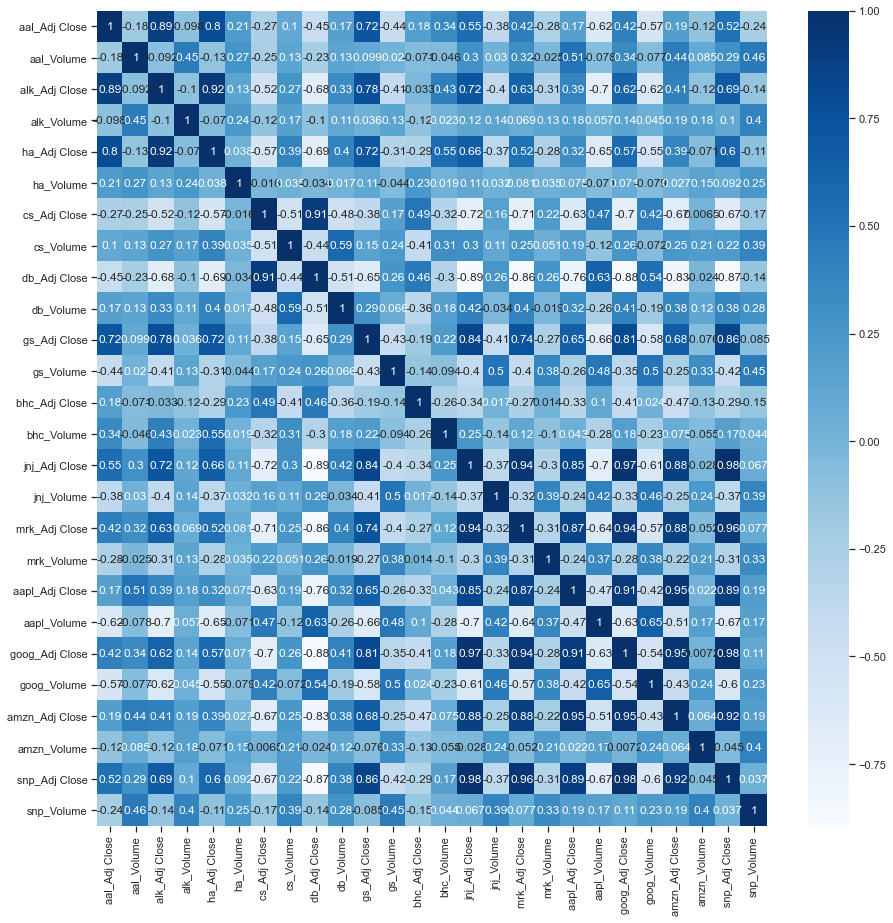

In [30]:
plt.figure(figsize=[15,15])
ax=sns.heatmap(heatmap.corr(),annot=True,cmap="Blues")
bottom, top = ax.get_ylim()

- According to the Heatmap, we can see that from light blue color to dark blue color, there are increasing correlations between the two variables. As a result, when a dark blue colored box appears, correlations are strong between these two variables.

### 3.3.2 Now for Closing price Visualization by Plotly

#### 3.3.2.1 import Libraries

In [31]:
import plotly
from plotly.subplots import make_subplots
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
from plotly.subplots import make_subplots

### 3.3.3 Closing Price for Technology, Healthcare, Aviation and Finance

In [33]:
# For Technology
fig=go.Figure()
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['aapl_Adj Close'],name='Apple Inc',fill="tonext"))
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['amzn_Adj Close'],name='Amazon',fill="toself"))
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['goog_Adj Close'],name='Alphabet',fill="tozeroy"))
fig.update_layout(title='Closing price for Technology',xaxis_title='Time Period',yaxis_title='Normal Price')
fig.show()

- Since it is apparent that the closing price for the technology sector is rising steadily, particularly for Amazon and Alphabet, we will be able to earn better earnings if we invest in this market. 

In [34]:
# For Healthcare
fig=go.Figure()
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['bhc_Adj Close'],name='Bausch Health Companies inc',fill="tozerox"))
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['jnj_Adj Close'],name='Johnson & Johnson',fill="toself"))
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['mrk_Adj Close'],name='Merck and CO inc.',fill="tonext"))
fig.update_layout(title='Closing price for Healthcare',xaxis_title='Time Period',yaxis_title='Normal Price')
fig.show()

- Using the above figure, we can see that Jonson&jonson and Merck&co all show a constant uptrend, but Bausch Health Companies goes through a sudden dip in trend and then remains constant.

In [35]:
# For Aviation
fig=go.Figure()
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['aal_Adj Close'],name='American Airlines Group Inc',fill="tozeroy"))
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['alk_Adj Close'],name='Alaska Air Group Inc',fill="tonexty"))
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['ha_Adj Close'],name='Hawaiian Holdings Inc',fill="tonextx"))
fig.update_layout(title='Closing price for Aviation',xaxis_title='Time Interval',yaxis_title='Normal Price')
fig.show()

- We can see that Hawaiian Holdings, Alaska Air and the American Airline Group had a little bit of an uptrend from 2010 to 2018 and were in a downward trend from 2018 to 2019.

In [36]:
# For Finance
fig=go.Figure()
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['cs_Adj Close'],name='Credit Suisse',fill="tozeroy"))
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['db_Adj Close'],name='Deutsche Bank',fill="tonexty"))
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['gs_Adj Close'],name='Goldman Sachs',fill="tonextx"))
fig.update_layout(title='Closing price for Finance',xaxis_title='Time Period',yaxis_title='Normal Price')
fig.show()

- As we can see from the above graph, finance sector is little different from other sectors. Goldman Sachs price is quite volatile so it goes up and down, but for Deutsche Bank and Credit Suisse they are always declining.

### 3.3.4 Volume of Technology, Healthcare, Aviation and Finance 

In [37]:
# For Technology
fig=go.Figure()
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['aapl_Volume'],name='Apple Inc',fill="tozeroy"))
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['amzn_Volume'],name='Amazon',fill="tonextx"))
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['goog_Volume'],name='Alphabet',fill="tonexty"))
fig.update_layout(title='Volume of  Technology',xaxis_title='Time Period',yaxis_title='Normal Price')
fig.show()

- Technology sector has a large volume, so people have a preference to invest in this sector. We can invest mainly in Apple and Amazon for good returns on investments.

In [38]:
# For Healthcare
fig=go.Figure()
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['bhc_Volume'],name='Bausch Health Companies inc',fill="toself"))
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['jnj_Volume'],name='Johnson & Johnson',fill="tonext"))
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['mrk_Volume'],name='Merck and CO inc.',fill="tozerox"))
fig.update_layout(title='Volume of Healthcare',xaxis_title='Time Period',yaxis_title='Normal Price')
fig.show()

- The Bausch Health companies have a high volume from 2015 to 2018. For Jonson&Jonsons and Merck&Co, the volume has been the same from the beginning.

In [39]:
#Aviation
fig=go.Figure()
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['aal_Volume'],name='American Airlines Group Inc',fill="tonext"))
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['alk_Volume'],name='Alaska Air Group Inc',fill="toself"))
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['ha_Volume'],name='Hawaiian Holdings Inc',fill="tozerox"))
fig.update_layout(title='Volume of Aviation',xaxis_title='Time Period',yaxis_title='Normal Price')
fig.show()

- At the moment, the volume of global aviation is not that volatile, but the volume of American Airlines Group is expected to be very high at 2020. 

In [40]:
# For Finance
fig=go.Figure()
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['cs_Volume'],name='Credit Suisse',fill="tozerox"))
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['db_Volume'],name='Deutsche Bank',fill="tonext"))
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['gs_Volume'],name='Goldman Sachs',fill="toself"))
fig.update_layout(title='Volume of Finance',xaxis_title='Time Period',yaxis_title='Normal Price')
fig.show()

- In the Finance Sector, volumes are good for Credit Suisse, Deutsche Bank, and Goldman Sachs. Among these, Deutsche Bank represents a high volume for 2016

### 3.3.5 Daily Return for Technology, Healthcare, Aviation, Finance and SNP500

In [41]:
#Technology
final_stock['aapl_dr']=final_stock['aapl_Adj Close'].pct_change()
final_stock['amzn_dr']=final_stock['amzn_Adj Close'].pct_change()
final_stock['goog_dr']=final_stock['goog_Adj Close'].pct_change()

In [42]:
#Healthcare
final_stock['bhc_dr']=final_stock['bhc_Adj Close'].pct_change()
final_stock['jnj_dr']=final_stock['jnj_Adj Close'].pct_change()
final_stock['mrk_dr']=final_stock['mrk_Adj Close'].pct_change()

In [43]:
# For Aviation
final_stock['aal_dr']=final_stock['aal_Adj Close'].pct_change()
final_stock['alk_dr']=final_stock['alk_Adj Close'].pct_change()
final_stock['ha_dr']=final_stock['ha_Adj Close'].pct_change()

In [44]:
#Finance
final_stock['cs_dr']=final_stock['cs_Adj Close'].pct_change()
final_stock['db_dr']=final_stock['db_Adj Close'].pct_change()
final_stock['gs_dr']=final_stock['gs_Adj Close'].pct_change()

In [45]:
#For SNP500
final_stock['snp_dr']=final_stock['snp_Adj Close'].pct_change()

#### 3.3.5.1 Now Creating New dataframe for daily return

In [46]:
#For Technology
Technology_dr=pd.DataFrame()
Technology_dr=final_stock[['aapl_dr','amzn_dr','goog_dr']]

In [47]:
#For HealthCare
Healthcare_dr=pd.DataFrame()
Healthcare_dr=final_stock[[ 'bhc_dr','jnj_dr','mrk_dr']]

In [48]:
#For Avation
Aviation_dr=pd.DataFrame()
Aviation_dr=final_stock[['aal_dr','alk_dr','ha_dr']]

In [49]:
#For Finance
Finance_dr=pd.DataFrame()
Finance_dr=final_stock[['cs_dr','db_dr','gs_dr']]

#### 3.3.5.2 Visualization by pairplot

<Figure size 720x720 with 0 Axes>

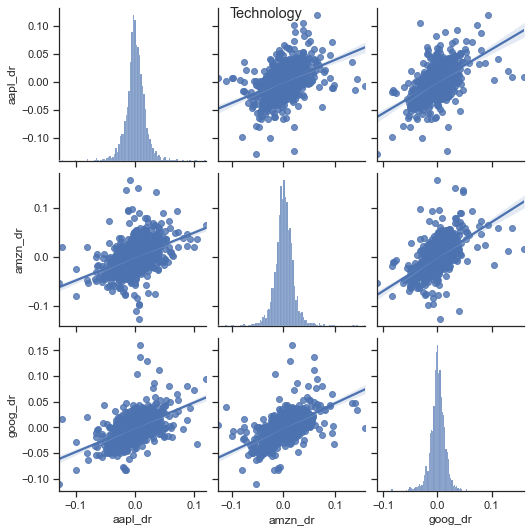

In [50]:
# For Techonology
plt.figure(figsize=[10,10])
sns.pairplot(Technology_dr,kind='reg')
plt.suptitle("Technology")
plt.show()

- We see from the Pairplot that all the points for Technology sector are quite close to the center line, but some points are scattered over the line.

<Figure size 1080x1080 with 0 Axes>

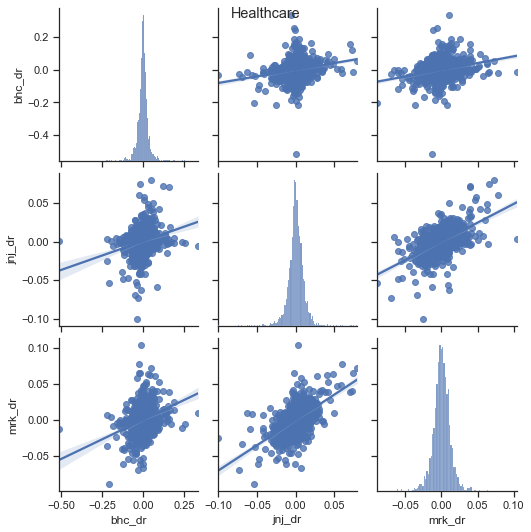

In [51]:
# For Healthcare
plt.figure(figsize=[15,15])
sns.pairplot(Healthcare_dr,kind='reg')
plt.suptitle("Healthcare")
plt.show()

- For the healthcare sector pair plot shows that most of all points are closer to the centerline.

<Figure size 720x720 with 0 Axes>

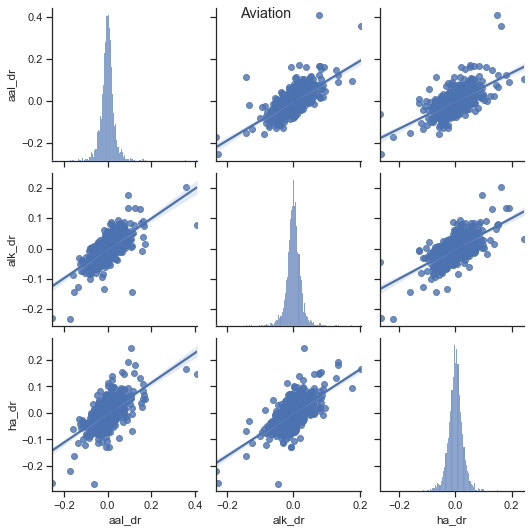

In [52]:
# Pairplot for Avation
plt.figure(figsize=[10,10])
sns.pairplot(Aviation_dr,kind='reg')
plt.suptitle("Aviation")
plt.show()

- As we saw in healthcare, Aviation also has closer points to the centerline.

<Figure size 720x720 with 0 Axes>

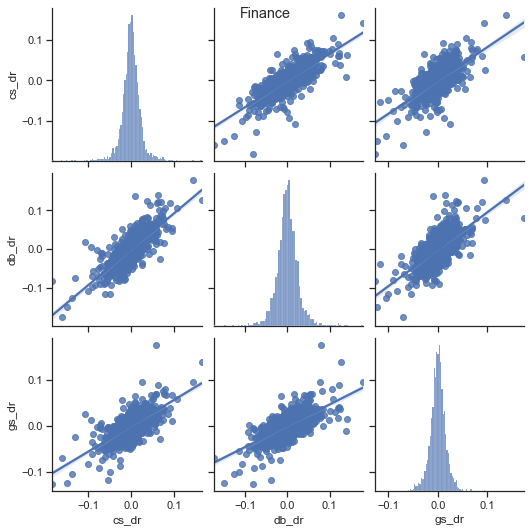

In [53]:
# Pairplot for Finance
plt.figure(figsize=[10,10])
sns.pairplot(Finance_dr,kind='reg')
plt.suptitle("Finance")
plt.show()

- From the above Pairplot of Finance sector compare to the Aviation, healthcare and technology, around 80% points are closer to the mainline.

## 3.4 Normalisation

### 3.4.1 Normalisation =  current price/first price entry

In [54]:
# For Technology
final_stock['normalized_aapl_price']=final_stock['aapl_Adj Close']/final_stock['aapl_Adj Close'].iloc[0]
final_stock['normalized_amzn_price']=final_stock['amzn_Adj Close']/final_stock['amzn_Adj Close'].iloc[0]
final_stock['nrmalized_goog_price']=final_stock['goog_Adj Close']/final_stock['goog_Adj Close'].iloc[0]

In [55]:
#For Healthcare
final_stock['normalized_bhc_price']=final_stock['bhc_Adj Close']/final_stock['bhc_Adj Close'].iloc[0]
final_stock['normalized_jnj_price']=final_stock['jnj_Adj Close']/final_stock['jnj_Adj Close'].iloc[0]
final_stock['normalized_mrk_price']=final_stock['mrk_Adj Close']/final_stock['mrk_Adj Close'].iloc[0]

In [56]:
#For Avation
final_stock['normalized_aal_price']=final_stock['aal_Adj Close']/final_stock['aal_Adj Close'].iloc[0]
final_stock['normalized_alk_price']=final_stock['alk_Adj Close']/final_stock['alk_Adj Close'].iloc[0]
final_stock['normalized_ha_price']=final_stock['ha_Adj Close']/final_stock['ha_Adj Close'].iloc[0]

In [57]:
#For Finance
final_stock['normalized_cs_price']=final_stock['cs_Adj Close']/final_stock['cs_Adj Close'].iloc[0]
final_stock['normalized_db_price']=final_stock['db_Adj Close']/final_stock['db_Adj Close'].iloc[0]
final_stock['normalized_gs_price']=final_stock['gs_Adj Close']/final_stock['gs_Adj Close'].iloc[0]

In [58]:
# For SNP
final_stock['normalized_snp_price']=final_stock['snp_Adj Close']/final_stock['snp_Adj Close'].iloc[0]

In [59]:
# For Technology
fig=go.Figure()
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['normalized_snp_price'],name='SNP'))
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['normalized_aapl_price'],name='Apple'))
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['normalized_amzn_price'],name='Amazon'))
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['nrmalized_goog_price'],name='Alphabet'))
fig.update_layout(title='Normalisation for Technology',xaxis_title='Date',yaxis_title='Normalized Price')
fig.show()

- As from the given figure we can compare Normalize Price of Apple, Amazon and Alphabet to SNP, Amazon and Apple have a great normalized price compare to SNP.

In [60]:
# For Healthcare
fig=go.Figure()
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['normalized_snp_price'],name='SNP'))
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['normalized_bhc_price'],name='Bausch Health Companies inc'))
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['normalized_jnj_price'],name='Johnson & Johnson'))
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['normalized_mrk_price'],name='Goldman Sachs'))
fig.update_layout(title='Normalisation for Healthcare',xaxis_title='Date',yaxis_title='Normalized Price')
fig.show()

- From the above figure Goldman Sachs and Jonson and Jonson companies normalize price are going parallel to the SNP, but Bausch Health Companies normalize price going upward from the SNP during 2010 to 2015 but after that fallen down from the SNP normalize price.

In [61]:
# For Aviation
fig=go.Figure()
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['normalized_snp_price'],name='SNP'))
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['normalized_aal_price'],name='American Airlines Group Inc'))
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['normalized_alk_price'],name='Alaska Air Group Inc'))
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['normalized_ha_price'],name='Hawaiian Holdings Inc'))
fig.update_layout(title='Normalisation for Aviation',xaxis_title='Date',yaxis_title='Normalized Price')
fig.show()

- From the Above graph of Aviation Normalized Price from the 2010 to 2013 going parallel to SNP but after 2013 to 2019 going upper side from the SNP and after that going Down.

In [62]:
# For Finance
fig=go.Figure()
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['normalized_snp_price'],name='SNP'))
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['normalized_cs_price'],name='Credit Suisse'))
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['normalized_db_price'],name='Deutsche Bank'))
fig.add_trace(go.Scatter(x=final_stock.index,y=final_stock['normalized_gs_price'],name='Goldman Sachs'))
fig.update_layout(title='Normalisation for Finance',xaxis_title='Date',yaxis_title='Normalized Price')
fig.show()

- Above graph Shows a different Normalized price compare to Aviation, Technology and Healthcare because, For Finance Goldman Sachs, Deutsche Bank and Credit Suisse are going Down from the SNP Price.

# 4. statistics

In [63]:
final_stock.describe()

,aal_Adj Close,aal_Volume,alk_Adj Close,alk_Volume,ha_Adj Close,ha_Volume,cs_Adj Close,cs_Volume,db_Adj Close,db_Volume,gs_Adj Close,gs_Volume,bhc_Adj Close,bhc_Volume,jnj_Adj Close,jnj_Volume,mrk_Adj Close,mrk_Volume,aapl_Adj Close,aapl_Volume,goog_Adj Close,goog_Volume,amzn_Adj Close,amzn_Volume,snp_Adj Close,snp_Volume,aapl_dr,amzn_dr,goog_dr,bhc_dr,jnj_dr,mrk_dr,aal_dr,alk_dr,ha_dr,cs_dr,db_dr,gs_dr,snp_dr,normalized_aapl_price,normalized_amzn_price,nrmalized_goog_price,normalized_bhc_price,normalized_jnj_price,normalized_mrk_price,normalized_aal_price,normalized_alk_price,normalized_ha_price,normalized_cs_price,normalized_db_price,normalized_gs_price,normalized_snp_price
count,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2516.000000,2516.000000,2516.000000,2516.000000,2516.000000,2516.000000,2516.000000,2516.000000,2516.000000,2516.000000,2516.000000,2516.000000,2516.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000,2517.000000
mean,28.332638,1.263146e+07,46.889544,1.648085e+06,22.182312,9.365502e+05,17.507931,2.476788e+06,25.029328,3.677383e+06,166.665287,3.833079e+06,61.869178,7.194057e+06,93.859400,8.605432e+06,50.180250,1.193947e+07,31.776725,2.635459e+08,730.426139,2.951427e+06,854.636107,4.326001e+06,2111.392732,3.739228e+09,0.001185,0.001398,0.000818,0.000480,0.000526,0.000545,0.000660,0.000760,0.000780,-0.000193,-0.000320,0.000350,0.000488,3.644470,5.560055,2.789711,2.498986,2.041748,1.926136,3.235033,4.273430,3.862814,0.580362,0.556436,1.310799,1.842016
std,14.712407,2.149322e+07,23.293159,1.095121e+06,14.964163,6.485618e+05,5.732890,1.847826e+06,13.191191,3.553901e+06,43.999974,2.187223e+06,57.177157,1.121985e+07,31.834527,4.493037e+06,17.593225,6.218030e+06,21.162673,2.037493e+08,364.685720,2.460964e+06,745.201139,2.410250e+06,612.227235,8.805742e+08,0.017705,0.019889,0.016288,0.035703,0.010811,0.013010,0.032723,0.023567,0.030147,0.022135,0.026340,0.018326,0.010934,2.427145,4.848098,1.392841,2.309469,0.692505,0.675305,1.679869,2.122897,2.605850,0.190037,0.293258,0.346054,0.534118
min,3.770966,1.158400e+06,10.242908,2.706000e+05,3.642072,1.205000e+05,6.552680,2.050000e+05,5.480000,0.000000e+00,76.414085,4.677000e+05,8.510000,3.803000e+05,43.686241,2.353800e+06,21.931190,2.235900e+06,8.599421,3.247000e+07,236.553345,7.900000e+03,153.029999,8.813000e+05,1099.229980,1.025000e+09,-0.128647,-0.126568,-0.111008,-0.514629,-0.100379,-0.088990,-0.252246,-0.232385,-0.269722,-0.182598,-0.174888,-0.127053,-0.119841,0.986267,0.995576,0.903466,0.343731,0.950318,0.841814,0.430571,0.933520,0.634228,0.217212,0.121828,0.600986,0.958988
25%,12.560000,5.368800e+06,24.650858,1.087600e+06,6.773483,5.395000e+05,12.715983,1.275300e+06,12.953422,1.527400e+06,139.162918,2.443200e+06,22.170000,1.677300e+06,66.644791,5.959500e+06,36.045670,8.222000e+06,16.853184,1.180676e+08,403.642059,1.393000e+06,266.489990,2.769400e+06,1562.170044,3.241030e+09,-0.006920,-0.008133,-0.006431,-0.013011,-0.004142,-0.005909,-0.014081,-0.010084,-0.013811,-0.010754,-0.013838,-0.008360,-0.003308,1.932890,1.733719,1.541627,0.895479,1.449742,1.383590,1.434106,2.246636,1.179530,0.421516,0.287972,1.094497,1.362865
50%,31.816221,7.405700e+06,55.455898,1.399400e+06,21.120163,7.699000e+05,16.708580,2.020700e+06,26.462519,2.767400e+06,164.142197,3.243900e+06,38.759998,3.203800e+06,89.460175,7.737300e+06,49.284191,1.055070e+07,25.673811,1.935080e+08,651.789978,2.030500e+06,533.750000,3.710900e+06,2071.219971,3.591270e+09,0.000923,0.001107,0.000659,0.000446,0.000444,0.000420,0.000241,0.000901,0.000451,0.000000,-0.000450,0.000600,0.000653,2.944527,3.472448,2.489376,1.565573,1.946051,1.891742,3.6327

In [64]:
statistics_adj = pd.DataFrame()

In [65]:
statistics_adj['Stocks']=['SnP500','American Airlines Group Inc','Alaska Air Group Inc', 'Hawaiian Holdings Inc','Credit Suisse','Deutsche Bank', 'Goldman Sachs',
                    'Bausch Health Companies inc','Johnson & Johnson', 'Merck and CO inc.','Apple Inc','Amazon', 'Alphabet']

In [66]:
# Mean
statistics_adj['Mean']=[final_stock['snp_Adj Close'].mean(),final_stock['aal_Adj Close'].mean(),final_stock['alk_Adj Close'].mean(),
                       final_stock['ha_Adj Close'].mean(),final_stock['cs_Adj Close'].mean(),final_stock['db_Adj Close'].mean(),final_stock['gs_Adj Close'].mean(),
                       final_stock['bhc_Adj Close'].mean(),final_stock['jnj_Adj Close'].mean(),final_stock['mrk_Adj Close'].mean(),
                       final_stock['aapl_Adj Close'].mean(),final_stock['amzn_Adj Close'].mean(),final_stock['goog_Adj Close'].mean(),]

In [67]:
#Median
statistics_adj['Median']= [final_stock['snp_Adj Close'].median(),final_stock['aal_Adj Close'].median(),final_stock['alk_Adj Close'].median(),final_stock['ha_Adj Close'].median(),final_stock['cs_Adj Close'].median(),
                      final_stock['db_Adj Close'].median(),final_stock['gs_Adj Close'].median(),final_stock['bhc_Adj Close'].median(),final_stock['jnj_Adj Close'].median(),final_stock['mrk_Adj Close'].median(),
                      final_stock['aapl_Adj Close'].median(),final_stock['amzn_Adj Close'].median(),final_stock['goog_Adj Close'].median()]

In [68]:
#Maximum 
statistics_adj['Maximum'] = [final_stock['snp_Adj Close'].max(),final_stock['aal_Adj Close'].max(),final_stock['alk_Adj Close'].max(),
                            final_stock['ha_Adj Close'].max(),final_stock['cs_Adj Close'].max(),
                            final_stock['db_Adj Close'].max(),final_stock['gs_Adj Close'].max(),
                            final_stock['bhc_Adj Close'].max(),final_stock['jnj_Adj Close'].max(),final_stock['mrk_Adj Close'].max(),
                            final_stock['aapl_Adj Close'].max(),final_stock['amzn_Adj Close'].max(),final_stock['goog_Adj Close'].max()]

In [69]:
#Minimum 
statistics_adj['Minimum'] = [final_stock['snp_Adj Close'].min(),final_stock['aal_Adj Close'].min(),
                                               final_stock['alk_Adj Close'].min(),
                                              final_stock['ha_Adj Close'].min(),final_stock['cs_Adj Close'].min(),
                                              final_stock['db_Adj Close'].min(),final_stock['gs_Adj Close'].min(),
                                              final_stock['bhc_Adj Close'].min(),final_stock['jnj_Adj Close'].min(),final_stock['mrk_Adj Close'].min(),
                                              final_stock['aapl_Adj Close'].min(),final_stock['amzn_Adj Close'].min(),final_stock['goog_Adj Close'].min()]

In [70]:
# Standard devation
statistics_adj['STDV'] = [final_stock['snp_Adj Close'].std(),final_stock['aal_Adj Close'].std(),
                                               final_stock['alk_Adj Close'].std(),
                                              final_stock['ha_Adj Close'].std(),final_stock['cs_Adj Close'].std(),
                                              final_stock['db_Adj Close'].std(),final_stock['gs_Adj Close'].std(),
                                              final_stock['bhc_Adj Close'].std(),final_stock['jnj_Adj Close'].std(),final_stock['mrk_Adj Close'].std(),
                                              final_stock['aapl_Adj Close'].std(),final_stock['amzn_Adj Close'].std(),final_stock['goog_Adj Close'].std()]

### 4.0.1 Clear Visual of Statistics

In [71]:
statistics_adj

,Stocks,Mean,Median,Maximum,Minimum,STDV
0,SnP500,2111.392732,2071.219971,3580.840088,1099.229980,612.227235
1,American Airlines Group Inc,28.332638,31.816221,56.988728,3.770966,14.712407
2,Alaska Air Group Inc,46.889544,55.455898,94.471420,10.242908,23.293159
3,Hawaiian Holdings Inc,22.182312,21.120163,58.099716,3.642072,14.964163
4,Credit Suisse,17.507931,16.708580,33.230030,6.552680,5.732890
5,Deutsche Bank,25.029328,26.462519,53.558323,5.480000,13.191191
6,Goldman Sachs,166.665287,164.142197,260.138916,76.414085,43.999974
7,Bausch Health Companies inc,61.869178,38.759998,262.519989,8.510000,57.177157
8,Johnson & Johnson,93.859400,89.460175,153.830002,43.686241,31.834527
9,Merck and CO inc.,50.180250,49.284191,89.912033,21.931190,17.593225


# 5. CAPM (Capital Asset Pricing Model)

In [72]:
dr_capm = pd.DataFrame()

In [73]:
dr_capm['Stocks']=['SnP500','American Airlines Group Inc','Alaska Air Group Inc', 'Hawaiian Holdings Inc','Credit Suisse','Deutsche Bank', 'Goldman Sachs',
                    'Bausch Health Companies inc','Johnson & Johnson', 'Merck and CO inc.','Apple Inc','Amazon', 'Alphabet']

In [74]:
# Mean
dr_capm['Mean']=[final_stock['snp_dr'].mean(),final_stock['aal_dr'].mean(),final_stock['alk_dr'].mean(),
                       final_stock['ha_dr'].mean(),final_stock['cs_dr'].mean(),final_stock['db_dr'].mean(),final_stock['gs_dr'].mean(),
                       final_stock['bhc_dr'].mean(),final_stock['jnj_dr'].mean(),final_stock['mrk_dr'].mean(),
                       final_stock['aapl_dr'].mean(),final_stock['amzn_dr'].mean(),final_stock['goog_dr'].mean()]

In [75]:
# Median
dr_capm['Median']=[final_stock['snp_dr'].median(),final_stock['aal_dr'].median(),final_stock['alk_dr'].median(),
                       final_stock['ha_dr'].median(),final_stock['cs_dr'].median(),final_stock['db_dr'].median(),final_stock['gs_dr'].median(),
                       final_stock['bhc_dr'].median(),final_stock['jnj_dr'].median(),final_stock['mrk_dr'].median(),
                       final_stock['aapl_dr'].median(),final_stock['amzn_dr'].median(),final_stock['goog_dr'].median()]

In [76]:
# Maximum
dr_capm['Maximum']=[final_stock['snp_dr'].max(),final_stock['aal_dr'].max(),final_stock['alk_dr'].max(),
                       final_stock['ha_dr'].max(),final_stock['cs_dr'].max(),final_stock['db_dr'].max(),final_stock['gs_dr'].max(),
                       final_stock['bhc_dr'].max(),final_stock['jnj_dr'].max(),final_stock['mrk_dr'].max(),
                       final_stock['aapl_dr'].max(),final_stock['amzn_dr'].max(),final_stock['goog_dr'].max()]

In [77]:
# Minimum
dr_capm['Minimum']=[final_stock['snp_dr'].min(),final_stock['aal_dr'].min(),final_stock['alk_dr'].min(),
                       final_stock['ha_dr'].min(),final_stock['cs_dr'].min(),final_stock['db_dr'].min(),final_stock['gs_dr'].min(),
                       final_stock['bhc_dr'].min(),final_stock['jnj_dr'].min(),final_stock['mrk_dr'].min(),
                       final_stock['aapl_dr'].min(),final_stock['amzn_dr'].min(),final_stock['goog_dr'].min()]

In [78]:
# Standard Deviation
dr_capm['STD']=[final_stock['snp_dr'].std(),final_stock['aal_dr'].std(),final_stock['alk_dr'].std(),
                       final_stock['ha_dr'].std(),final_stock['cs_dr'].std(),final_stock['db_dr'].std(),final_stock['gs_dr'].std(),
                       final_stock['bhc_dr'].std(),final_stock['jnj_dr'].std(),final_stock['mrk_dr'].std(),
                       final_stock['aapl_dr'].std(),final_stock['amzn_dr'].std(),final_stock['goog_dr'].std()]

In [79]:
# Annual Return
dr_capm['Annual_Retuen']=[252*final_stock['snp_dr'].mean(),252*final_stock['aal_dr'].mean(),252*final_stock['alk_dr'].mean(),
                       252*final_stock['ha_dr'].mean(),252*final_stock['cs_dr'].mean(),252*final_stock['db_dr'].mean(),252*final_stock['gs_dr'].mean(),
                       252*final_stock['bhc_dr'].mean(),252*final_stock['jnj_dr'].mean(),252*final_stock['mrk_dr'].mean(),
                       252*final_stock['aapl_dr'].mean(),252*final_stock['amzn_dr'].mean(),252*final_stock['goog_dr'].mean()]

In [80]:
# Annual Standard deviationstd
dr_capm['Annual_Retuen_std']=[math.sqrt(252)*final_stock['snp_dr'].std(),math.sqrt(252)*final_stock['aal_dr'].std(),math.sqrt(252)*final_stock['alk_dr'].std(),
                       math.sqrt(252)*final_stock['ha_dr'].std(),math.sqrt(252)*final_stock['cs_dr'].std(),math.sqrt(252)*final_stock['db_dr'].std(),math.sqrt(252)*final_stock['gs_dr'].std(),
                       math.sqrt(252)*final_stock['bhc_dr'].std(),math.sqrt(252)*final_stock['jnj_dr'].std(),math.sqrt(252)*final_stock['mrk_dr'].std(),
                       math.sqrt(252)*final_stock['aapl_dr'].std(),math.sqrt(252)*final_stock['amzn_dr'].std(),math.sqrt(252)*final_stock['goog_dr'].std()]

In [81]:
dr_capm

,Stocks,Mean,Median,Maximum,Minimum,STD,Annual_Retuen,Annual_Retuen_std
0,SnP500,0.000488,0.000653,0.093828,-0.119841,0.010934,0.122966,0.173574
1,American Airlines Group Inc,0.000660,0.000241,0.410970,-0.252246,0.032723,0.166373,0.519460
2,Alaska Air Group Inc,0.000760,0.000901,0.203079,-0.232385,0.023567,0.191462,0.374120
3,Hawaiian Holdings Inc,0.000780,0.000451,0.245837,-0.269722,0.030147,0.196545,0.478565
4,Credit Suisse,-0.000193,0.000000,0.163447,-0.182598,0.022135,-0.048632,0.351386
5,Deutsche Bank,-0.000320,-0.000450,0.179507,-0.174888,0.026340,-0.080686,0.418133
6,Goldman Sachs,0.000350,0.000600,0.175803,-0.127053,0.018326,0.088198,0.290914
7,Bausch Health Companies inc,0.000480,0.000446,0.337444,-0.514629,0.035703,0.120938,0.566763
8,Johnson & Johnson,0.000526,0.000444,0.079977,-0.100379,0.010811,0.132479,0.171613
9,Merck and CO inc.,0.000545,0.000420,0.104080,-0.088990,0.013010,0.137319,0.206535


# 6. BETA Values

In [82]:
dr_beta = final_stock[['snp_dr','aal_dr','alk_dr','ha_dr','cs_dr','db_dr','gs_dr','bhc_dr','jnj_dr','mrk_dr','aapl_dr','amzn_dr','goog_dr']]

In [83]:
dr_beta = dr_beta.dropna()

## 6.1 BETA Values for Technology

In [84]:
# linear regression model for AAPL daily returns
X=dr_beta['snp_dr']
y=dr_beta['aapl_dr']
X_sm=sm.add_constant(X)
linear_regre_aapl=sm.OLS(y,X_sm).fit()
print('aapl',linear_regre_aapl.summary())

aapl                             OLS Regression Results                            
Dep. Variable:                aapl_dr   R-squared:                       0.431
Model:                            OLS   Adj. R-squared:                  0.431
Method:                 Least Squares   F-statistic:                     1905.
Date:                Mon, 05 Jul 2021   Prob (F-statistic):          3.34e-310
Time:                        21:59:37   Log-Likelihood:                 7289.1
No. Observations:                2516   AIC:                        -1.457e+04
Df Residuals:                    2514   BIC:                        -1.456e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0007      0.000      2.501    

In [85]:
#Lregression model for AMZN daily returns
X=dr_beta['snp_dr']
y=dr_beta['amzn_dr']
X_sm=sm.add_constant(X)
linear_regre_amzn=sm.OLS(y,X_sm).fit()
print('amzn',linear_regre_amzn.summary())

amzn                             OLS Regression Results                            
Dep. Variable:                amzn_dr   R-squared:                       0.301
Model:                            OLS   Adj. R-squared:                  0.301
Method:                 Least Squares   F-statistic:                     1085.
Date:                Mon, 05 Jul 2021   Prob (F-statistic):          3.80e-198
Time:                        21:59:37   Log-Likelihood:                 6738.4
No. Observations:                2516   AIC:                        -1.347e+04
Df Residuals:                    2514   BIC:                        -1.346e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0009      0.000      2.743    

In [86]:
# linear regression model for GOOG daily returns
X=dr_beta['snp_dr']
y=dr_beta['goog_dr']
X_sm=sm.add_constant(X)
linear_regre_goog=sm.OLS(y,X_sm).fit()
print('goog',linear_regre_goog.summary())

goog                             OLS Regression Results                            
Dep. Variable:                goog_dr   R-squared:                       0.463
Model:                            OLS   Adj. R-squared:                  0.463
Method:                 Least Squares   F-statistic:                     2165.
Date:                Mon, 05 Jul 2021   Prob (F-statistic):               0.00
Time:                        21:59:37   Log-Likelihood:                 7571.3
No. Observations:                2516   AIC:                        -1.514e+04
Df Residuals:                    2514   BIC:                        -1.513e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0003      0.000      1.356    

## 6.2 BETA Values for Healthcare

In [87]:
#linear regression model for BHC daily returns
X=dr_beta['snp_dr']
y=dr_beta['bhc_dr']
X_sm=sm.add_constant(X)
linear_regre_bhc=sm.OLS(y,X_sm).fit()
print('bhc',linear_regre_bhc.summary())

bhc                             OLS Regression Results                            
Dep. Variable:                 bhc_dr   R-squared:                       0.163
Model:                            OLS   Adj. R-squared:                  0.162
Method:                 Least Squares   F-statistic:                     488.0
Date:                Mon, 05 Jul 2021   Prob (F-statistic):           5.65e-99
Time:                        21:59:45   Log-Likelihood:                 5038.3
No. Observations:                2516   AIC:                        -1.007e+04
Df Residuals:                    2514   BIC:                        -1.006e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0002      0.001     -0.249     

In [88]:
# linear regression model for  JNJ daily returns
X=dr_beta['snp_dr']
y=dr_beta['jnj_dr']
X_sm=sm.add_constant(X)
linear_regre_jnj=sm.OLS(y,X_sm).fit()
print('jnj',linear_regre_jnj.summary())

jnj                             OLS Regression Results                            
Dep. Variable:                 jnj_dr   R-squared:                       0.451
Model:                            OLS   Adj. R-squared:                  0.451
Method:                 Least Squares   F-statistic:                     2065.
Date:                Mon, 05 Jul 2021   Prob (F-statistic):               0.00
Time:                        21:59:50   Log-Likelihood:                 8575.2
No. Observations:                2516   AIC:                        -1.715e+04
Df Residuals:                    2514   BIC:                        -1.713e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0002      0.000      1.262     

In [89]:
# linear regression model for  MRK daily returns
X=dr_beta['snp_dr']
y=dr_beta['mrk_dr']
X_sm=sm.add_constant(X)
linear_regre_mrk=sm.OLS(y,X_sm).fit()
print('mrk',linear_regre_mrk.summary())

mrk                             OLS Regression Results                            
Dep. Variable:                 mrk_dr   R-squared:                       0.383
Model:                            OLS   Adj. R-squared:                  0.383
Method:                 Least Squares   F-statistic:                     1562.
Date:                Mon, 05 Jul 2021   Prob (F-statistic):          3.73e-266
Time:                        22:00:00   Log-Likelihood:                 7962.9
No. Observations:                2516   AIC:                        -1.592e+04
Df Residuals:                    2514   BIC:                        -1.591e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0002      0.000      0.909     

## 6.3 BETA Values for Aviation

In [90]:
#linear regression model for AAL Daily Return to find the beta value
X=dr_beta['snp_dr']
y=dr_beta['aal_dr']
X_sm=sm.add_constant(X)
linear_regre_aal=sm.OLS(y,X_sm).fit()
print('aal',linear_regre_aal.summary())

aal                             OLS Regression Results                            
Dep. Variable:                 aal_dr   R-squared:                       0.204
Model:                            OLS   Adj. R-squared:                  0.204
Method:                 Least Squares   F-statistic:                     646.2
Date:                Mon, 05 Jul 2021   Prob (F-statistic):          4.57e-127
Time:                        22:00:03   Log-Likelihood:                 5322.2
No. Observations:                2516   AIC:                        -1.064e+04
Df Residuals:                    2514   BIC:                        -1.063e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1.524e-07      0.001     -0.000     

In [91]:
#linear regression model for ALK Daily Returns
X=dr_beta['snp_dr']
y=dr_beta['alk_dr']
X_sm=sm.add_constant(X)
linear_regre_alk=sm.OLS(y,X_sm).fit()
print('alk',linear_regre_alk.summary())

alk                             OLS Regression Results                            
Dep. Variable:                 alk_dr   R-squared:                       0.327
Model:                            OLS   Adj. R-squared:                  0.326
Method:                 Least Squares   F-statistic:                     1220.
Date:                Mon, 05 Jul 2021   Prob (F-statistic):          3.19e-218
Time:                        22:00:04   Log-Likelihood:                 6357.8
No. Observations:                2516   AIC:                        -1.271e+04
Df Residuals:                    2514   BIC:                        -1.270e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0002      0.000      0.411     

In [92]:
#linear regression model with HA daily returns
X=dr_beta['snp_dr']
y=dr_beta['ha_dr']
X_sm=sm.add_constant(X)
linear_regre_ha=sm.OLS(y,X_sm).fit()
print('ha',linear_regre_ha.summary())

ha                             OLS Regression Results                            
Dep. Variable:                  ha_dr   R-squared:                       0.200
Model:                            OLS   Adj. R-squared:                  0.200
Method:                 Least Squares   F-statistic:                     629.7
Date:                Mon, 05 Jul 2021   Prob (F-statistic):          3.42e-124
Time:                        22:00:04   Log-Likelihood:                 5521.8
No. Observations:                2516   AIC:                        -1.104e+04
Df Residuals:                    2514   BIC:                        -1.103e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0002      0.001      0.330      

## 6.4 BETA Values for finance

In [93]:
#linear regression model for CS daily returns
X=dr_beta['snp_dr']
y=dr_beta['cs_dr']
X_sm=sm.add_constant(X)
linear_regre_cs=sm.OLS(y,X_sm).fit()
print('cs',linear_regre_cs.summary())

cs                             OLS Regression Results                            
Dep. Variable:                  cs_dr   R-squared:                       0.460
Model:                            OLS   Adj. R-squared:                  0.460
Method:                 Least Squares   F-statistic:                     2140.
Date:                Mon, 05 Jul 2021   Prob (F-statistic):               0.00
Time:                        22:00:07   Log-Likelihood:                 6792.5
No. Observations:                2516   AIC:                        -1.358e+04
Df Residuals:                    2514   BIC:                        -1.357e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0009      0.000     -2.657      

In [94]:
#linear regression model for DB daily returns
X=dr_beta['snp_dr']
y=dr_beta['db_dr']
X_sm=sm.add_constant(X)
linear_regre_db=sm.OLS(y,X_sm).fit()
print('db',linear_regre_db.summary())

db                             OLS Regression Results                            
Dep. Variable:                  db_dr   R-squared:                       0.406
Model:                            OLS   Adj. R-squared:                  0.406
Method:                 Least Squares   F-statistic:                     1722.
Date:                Mon, 05 Jul 2021   Prob (F-statistic):          4.12e-287
Time:                        22:00:10   Log-Likelihood:                 6236.6
No. Observations:                2516   AIC:                        -1.247e+04
Df Residuals:                    2514   BIC:                        -1.246e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0011      0.000     -2.641      

In [95]:
#linear regression model for GS daily returns
X=dr_beta['snp_dr']
y=dr_beta['gs_dr']
X_sm=sm.add_constant(X)
linear_regre_gs=sm.OLS(y,X_sm).fit()
print('gs',linear_regre_gs.summary())

gs                             OLS Regression Results                            
Dep. Variable:                  gs_dr   R-squared:                       0.603
Model:                            OLS   Adj. R-squared:                  0.603
Method:                 Least Squares   F-statistic:                     3818.
Date:                Mon, 05 Jul 2021   Prob (F-statistic):               0.00
Time:                        22:00:11   Log-Likelihood:                 7655.2
No. Observations:                2516   AIC:                        -1.531e+04
Df Residuals:                    2514   BIC:                        -1.529e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0003      0.000     -1.237      

## 6.5 Calculating Expected Return

### 6.5.1 For Technology

In [96]:
apple_beta=1.063
amazon_beta=0.998
google_beta=1.013

### 6.5.2 For Healthcare

In [97]:
bausch_health_co_beta=1.317
jonson_and_jonson_beta=0.6640
merck_and_co_beta=0.737

### 6.5.3 For Aviation

In [98]:
american_airlines_beta=1.352
alaska_air_beta=1.232
hawaiian_beta=1.234

### 6.5.4 For Finance

In [99]:
credit_suisse_beta=1.373
deutsche_bank_beta=1.536
goldman_sachs_beta=1.302

### 6.5.5 Creating another column for each to find the beta values of each stock and their expected returns

In [100]:
expected_return_df=pd.DataFrame()

In [101]:
expected_return_df['Companies']=['Apple Inc', 'Alphabet','Amazon','Bausch Health Companies inc'
                                 ,'Johnson & Johnson', 'Merck and CO inc.',
                                 'American Airlines Group Inc','Alaska Air Group Inc','Hawaiian Holdings Inc','Credit Suisse',
                                 'Deutsche Bank', 'Goldman Sachs',]

In [102]:
expected_return_df['Beta Values']=[apple_beta,google_beta,amazon_beta,bausch_health_co_beta,
                                   jonson_and_jonson_beta,merck_and_co_beta,american_airlines_beta,alaska_air_beta,
                                   hawaiian_beta,credit_suisse_beta,deutsche_bank_beta,
                                   goldman_sachs_beta]

In [103]:
expected_return_df['Expected Returns']=[0.75+apple_beta*(12.3-0.75),
                                        0.75+google_beta*(12.3-0.75),
                                        0.75+amazon_beta*(12.3-0.75),
                                        0.75+bausch_health_co_beta*(12.3-0.75),
                                        0.75+jonson_and_jonson_beta*(12.3-0.75),
                                        0.75+merck_and_co_beta*(12.3-0.75),
                                        0.75+american_airlines_beta*(12.3-0.75),
                                        0.75+alaska_air_beta*(12.3-0.75),
                                        0.75+hawaiian_beta*(12.3-0.75),
                                        0.75+credit_suisse_beta*(12.3-0.75),
                                        0.75+deutsche_bank_beta*(12.3-0.75),
                                        0.75+goldman_sachs_beta*(12.3-0.75),
                                        ]

In [104]:
expected_return_df['Expected Returns']=expected_return_df['Expected Returns'].round(3)
expected_return_df

,Companies,Beta Values,Expected Returns
0,Apple Inc,1.063,13.028
1,Alphabet,1.013,12.450
2,Amazon,0.998,12.277
3,Bausch Health Companies inc,1.317,15.961
4,Johnson & Johnson,0.664,8.419
5,Merck and CO inc.,0.737,9.262
6,American Airlines Group Inc,1.352,16.366
7,Alaska Air Group Inc,1.232,14.980
8,Hawaiian Holdings Inc,1.234,15.003
9,Credit Suisse,1.373,16.608


### 6.5.6 Dividing the portfolio by the number of stocks present in the table

In [105]:
expected_return_df['Portfolio']=1/len(expected_return_df)
expected_return_df=expected_return_df.set_index(['Companies'])

In [106]:
expected_return_df

,Beta Values,Expected Returns,Portfolio
Companies,,,
Apple Inc,1.063,13.028,0.083333
Alphabet,1.013,12.450,0.083333
Amazon,0.998,12.277,0.083333
Bausch Health Companies inc,1.317,15.961,0.083333
Johnson & Johnson,0.664,8.419,0.083333
Merck and CO inc.,0.737,9.262,0.083333
American Airlines Group Inc,1.352,16.366,0.083333
Alaska Air Group Inc,1.232,14.980,0.083333
Hawaiian Holdings Inc,1.234,15.003,0.083333


### 6.5.7 Creating Beta Portfolio

In [107]:
beta_portfolio = sum(expected_return_df['Beta Values']*expected_return_df['Portfolio'])
beta_portfolio

1.15175

### 6.5.8 Adding only the companies below to the portfolio to calculate the portfolio beta

In [108]:
final_expected_return_df=expected_return_df.drop(["American Airlines Group Inc","Credit Suisse","Hawaiian Holdings Inc",
"Johnson & Johnson","Merck and CO inc.","Deutsche Bank"])

In [109]:
final_expected_return_df['Portfolio']=(1/len(final_expected_return_df))
final_expected_return_df

,Beta Values,Expected Returns,Portfolio
Companies,,,
Apple Inc,1.063,13.028,0.166667
Alphabet,1.013,12.450,0.166667
Amazon,0.998,12.277,0.166667
Bausch Health Companies inc,1.317,15.961,0.166667
Alaska Air Group Inc,1.232,14.980,0.166667
Goldman Sachs,1.302,15.788,0.166667


In [110]:
# Checking the updated portfolio beta
final_expected_return_df['Portfolio']=(1/len(final_expected_return_df))
new_beta_portfolio=sum(final_expected_return_df['Beta Values']*final_expected_return_df['Portfolio'])
print(np.round(new_beta_portfolio,3))

1.154


In [111]:
# checking the expected return based the selection of our stocks
new_beta_portfolio=0.75+new_beta_portfolio*(12.3-0.75)
print(np.round(new_beta_portfolio,3))

14.081


# 7. Price Prediction

### 7.0.1 Creating the dataframe

In [112]:
price_prediction=final_stock[['alk_Adj Close', 'bhc_Adj Close','gs_Adj Close','aapl_Adj Close', 'goog_Adj Close', 
'amzn_Adj Close','alk_Volume','bhc_Volume', 'gs_Volume','aapl_Volume','goog_Volume','amzn_Volume']]

In [113]:
# resetting the index
price_prediction=price_prediction.reset_index()

In [114]:
# selecting date format 
price_prediction['Date']=pd.to_datetime(price_prediction['Date'],format='%d-%m-%Y')
price_prediction=price_prediction.set_index('Date')
price_prediction.head()

,alk_Adj Close,bhc_Adj Close,gs_Adj Close,aapl_Adj Close,goog_Adj Close,amzn_Adj Close,alk_Volume,bhc_Volume,gs_Volume,aapl_Volume,goog_Volume,amzn_Volume
Date,,,,,,,,,,,,
2010-10-01,10.972344,24.757708,127.147858,8.719163,261.828613,153.710007,1663600.0,5778700.0,7439800.0,448142800,4466600.0,8683400.0
2010-10-04,10.703489,24.873083,126.175117,8.599421,260.199707,155.389999,1512400.0,4187200.0,5866700.0,435302000,3895400.0,5346500.0
2010-10-05,10.767396,25.286512,128.757706,8.917298,268.110046,160.869995,2567200.0,4610300.0,8724700.0,501967200,7040400.0,5620000.0
2010-10-06,10.743157,25.661484,129.850906,8.925013,266.177307,155.399994,1043600.0,4448900.0,6330600.0,670868800,5545200.0,6060800.0
2010-10-07,10.247319,25.574951,130.083435,8.925941,264.015411,156.270004,7682400.0,2453900.0,4471500.0,408399600,4809400.0,4622000.0


## 7.1 Check for stationarity

In [115]:
 from statsmodels.tsa.stattools import kpss

for col in price_prediction.columns:
    kpss_test = kpss(price_prediction[col])
    
    print(col)
    print('KPSS Statistic: %f' % kpss_test[0])
    print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
    print('p-value: %f' % kpss_test[1])
    
    if kpss_test[1] <= 0.05:
        print("\nSeries is Stationary")
    else:
        print("\nSeries is Non-Stationary")
        
    print('\n###############################################\n')

alk_Adj Close
KPSS Statistic: 5.946983
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Stationary

###############################################

bhc_Adj Close
KPSS Statistic: 2.252978
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Stationary

###############################################

gs_Adj Close
KPSS Statistic: 6.629594
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Stationary

###############################################

aapl_Adj Close
KPSS Statistic: 6.823155
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Stationary

###############################################

goog_Adj Close
KPSS Statistic: 8.721507
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Stationary

###############################################

amzn_Adj Close
KPSS Statistic: 7.681389
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Stationary

###############################################

alk_Volume
KPSS Statistic: 0.573942
Critical Value

C:\Users\perin\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1874: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.


C:\Users\perin\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1874: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.


C:\Users\perin\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1874: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.


C:\Users\perin\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1874: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.


C:\Users\per

## 7.3 Train and Test Split

In [116]:
train_len=int(price_prediction.shape[0]*0.7)
test_len=int(price_prediction.shape[0])-int(price_prediction.shape[0]*0.7)

In [117]:
#Train data and Test data
train_data=price_prediction[:train_len]
test_data=price_prediction[train_len:]
model=VAR(train_data)

C:\Users\perin\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:581: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



### 7.3.1 Lag Selection

In [118]:
x=model.select_order(maxlags=50)
x.summary()

,AIC,BIC,FPE,HQIC
0,223.4,223.4,1.021e+97,223.4
1,191.2,191.7*,1.045e+83,191.3*
2,191.1*,192.1,9.909e+82*,191.5
3,191.1,192.6,1.035e+83,191.7
4,191.2,193.1,1.074e+83,191.9
5,191.2,193.6,1.136e+83,192.1
6,191.3,194.1,1.206e+83,192.3
7,191.3,194.6,1.265e+83,192.5
8,191.4,195.1,1.352e+83,192.8
9,191.5,195.6,1.436e+83,193.0


### 7.3.2 Selecting Max Lag

In [119]:
result = model.fit(maxlags = 2, ic = 'aic')

In [120]:
result.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 05, Jul, 2021
Time:                     22:00:55
--------------------------------------------------------------------
No. of Equations:         12.0000    BIC:                    192.039
Nobs:                     1759.00    HQIC:                   191.450
Log likelihood:          -197728.    FPE:                9.91026e+82
AIC:                      191.106    Det(Omega_mle):     8.36637e+82
--------------------------------------------------------------------
Results for equation alk_Adj Close
                       coefficient       std. error           t-stat            prob
------------------------------------------------------------------------------------
const                    -0.271857         0.220134           -1.235           0.217
L1.alk_Adj Close          0.955615         0.026747           35.728           0.000
L1.bhc_Adj Close          0.011740  

In [121]:
lag_order=2

In [122]:
#prediction
price_predicted_values=result.forecast(train_data.values[-lag_order:],test_len)
forecast=pd.DataFrame(price_predicted_values,index=price_prediction.index[train_len:],columns=price_prediction.columns)

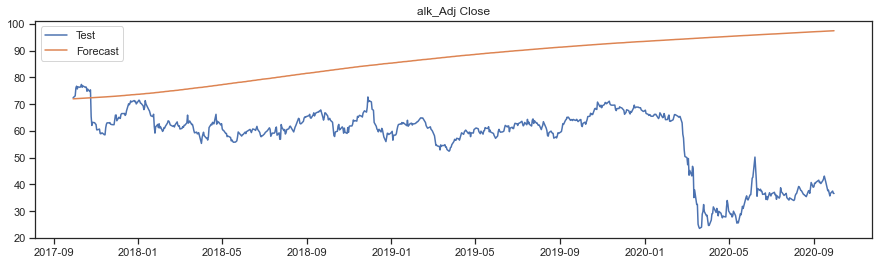

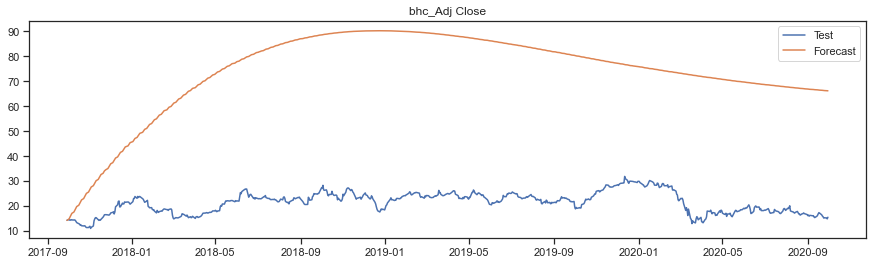

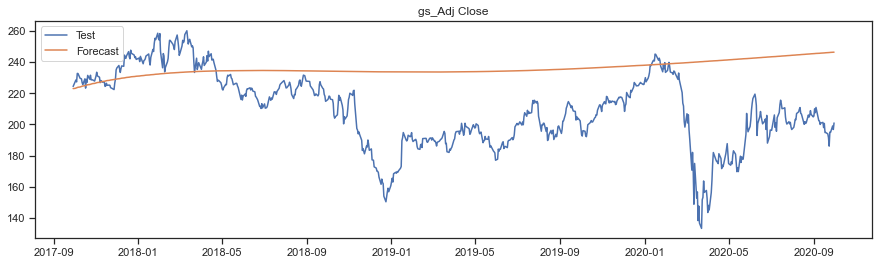

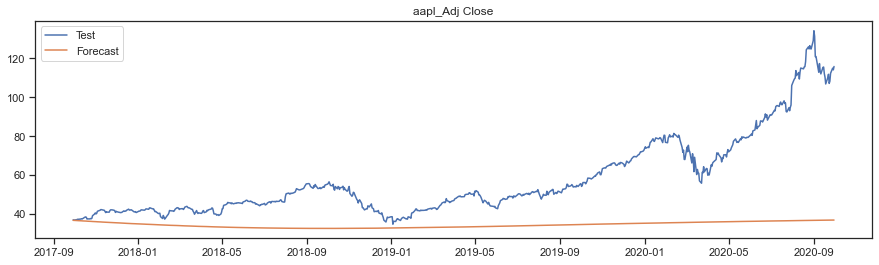

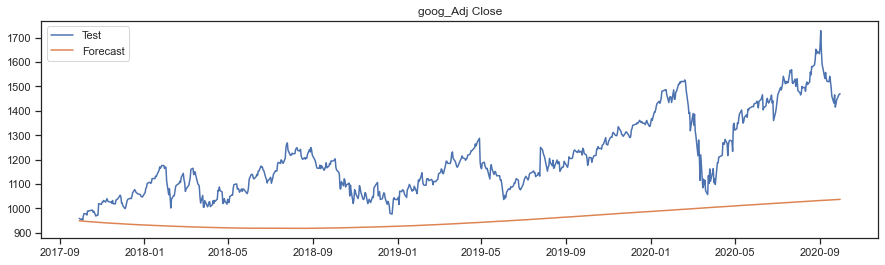

...

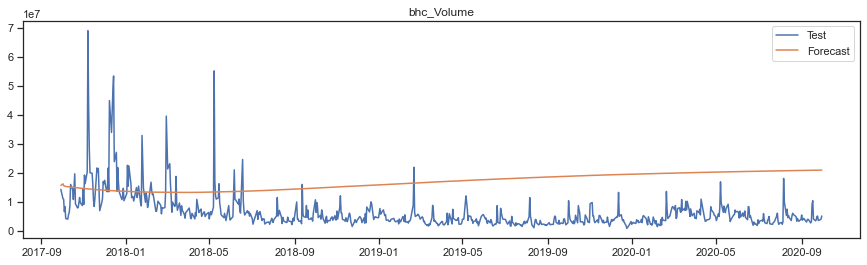

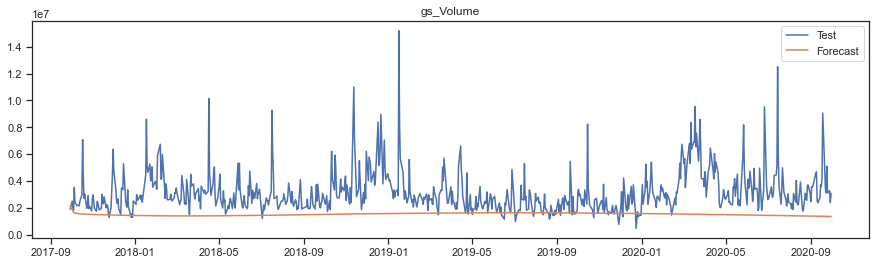

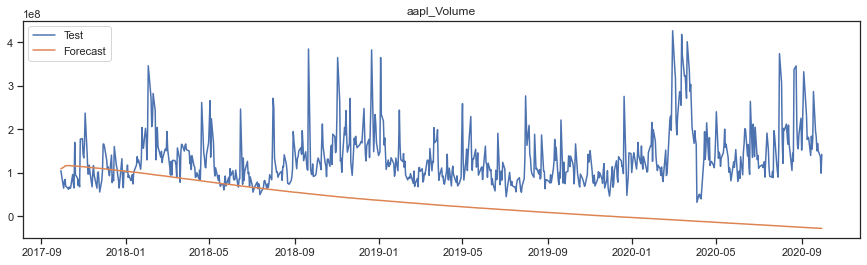

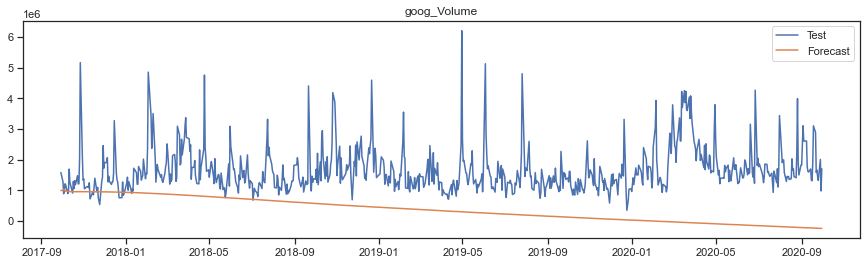

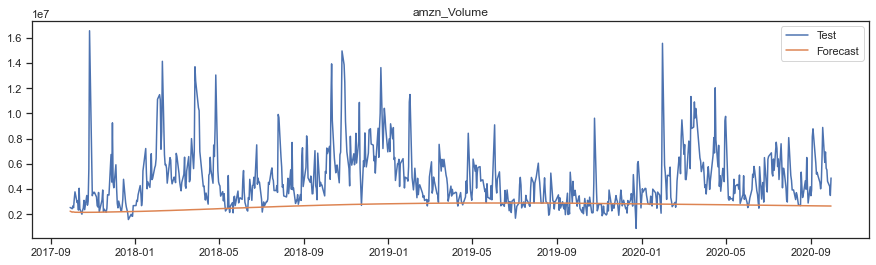

In [123]:
# checking the test and forcast values by plotting it
for col in price_prediction.columns:
    plt.figure(figsize=(15,4))
    plt.plot(price_prediction[col][train_len:], label='Test')
    plt.plot(forecast[col][:], label='Forecast')
    plt.legend(loc='best')
    plt.title(col)
    plt.show()

- As we can see that from the above Graphs of Test and Forecast,  some of them are parallel to each other like Alaska air group, Goldman Sachs and Amazon and some of them are over and under the test line.

### 7.3.3 checking the test, train and forcast values by plotting 

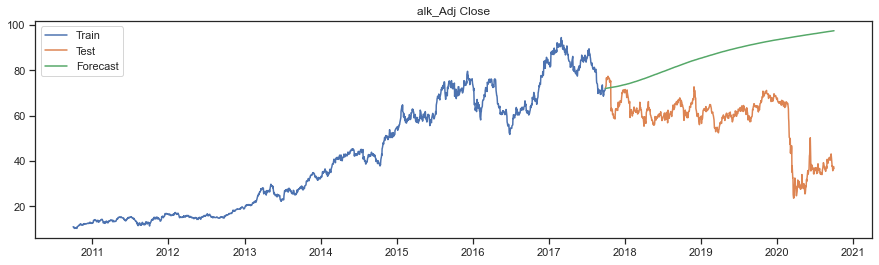

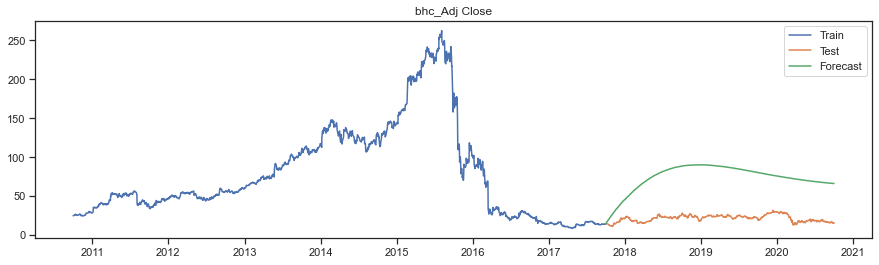

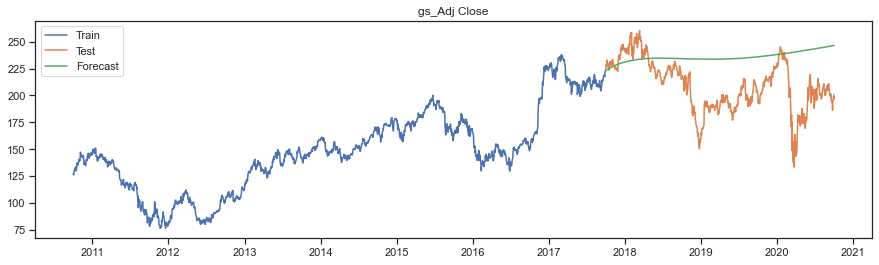

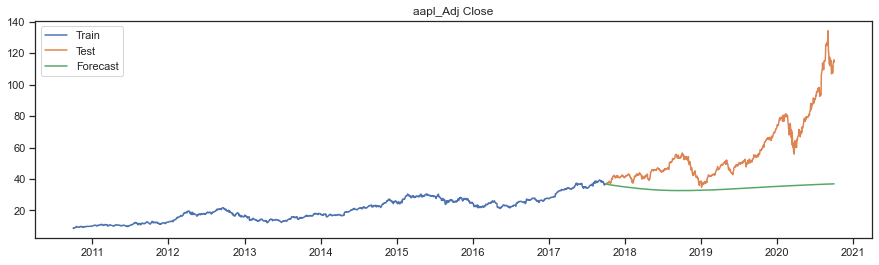

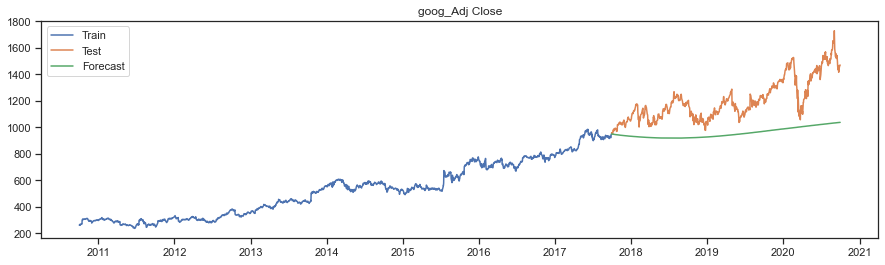

...

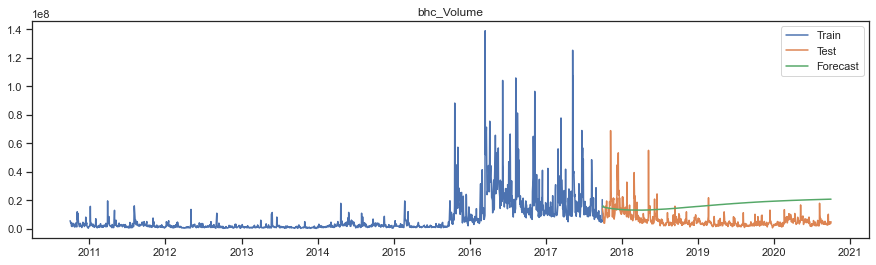

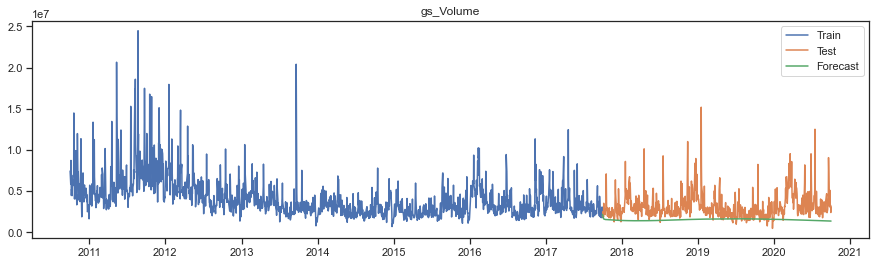

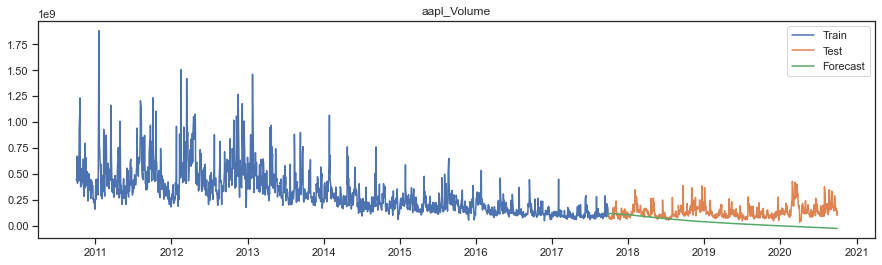

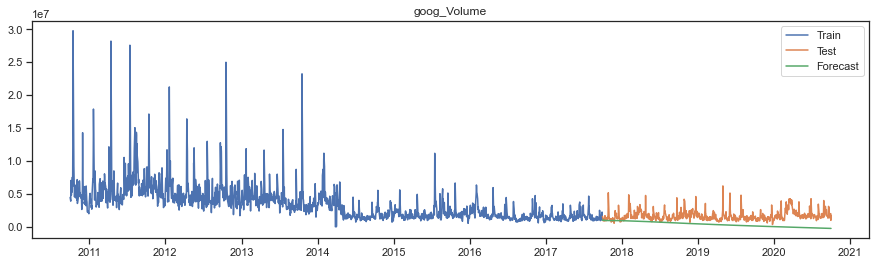

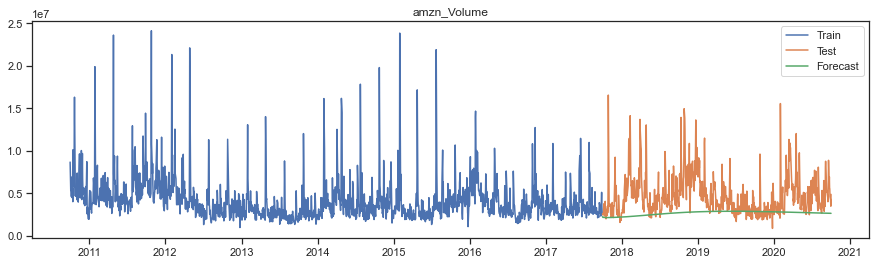

In [124]:
for col in price_prediction.columns:
    plt.figure(figsize=(15,4))
    plt.plot(price_prediction[col][:train_len], label='Train')
    plt.plot(price_prediction[col][train_len:], label='Test')
    plt.plot(forecast[col][:], label='Forecast')
    plt.legend(loc='best')
    plt.title(col)
    plt.show()

- As shown in the above graph Amazon, Google, Apple, Goldman Sachs, Alaska Air group have a good forecast line on Test.

# 8. Model Evaluation

In [125]:
model_evaluation = pd.DataFrame(columns=['Column', 'RMSE', 'MAPE'])
result = pd.DataFrame(columns=['Column', 'RMSE', 'MAPE'])

for col in price_prediction.columns:
    rmse = np.sqrt(mean_squared_error(test_data[col], forecast[col][:])).round(2)
    mape = np.round(np.mean(np.abs(test_data[col]-forecast[col][:])/test_data[col])*100,2)

    result = pd.DataFrame({'Column':[col], 'RMSE': [rmse],'MAPE': [mape] })
    model_evaluation= pd.concat([model_evaluation, result])
    
model_evaluation

,Column,RMSE,MAPE
0,alk_Adj Close,3.395000e+01,63.26
0,bhc_Adj Close,5.435000e+01,247.69
0,gs_Adj Close,3.661000e+01,15.66
0,aapl_Adj Close,3.015000e+01,34.66
0,goog_Adj Close,2.793200e+02,19.60
0,amzn_Adj Close,1.056600e+03,47.54
0,alk_Volume,1.493226e+06,42.66
0,bhc_Volume,1.298709e+07,321.65
0,gs_Volume,2.260866e+06,44.64
0,aapl_Volume,1.285027e+08,73.00


## 8.1 Prediction For Upcoming days

In [126]:
price_predict=VAR(price_prediction)
predicted_result=price_predict.fit()

C:\Users\perin\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:581: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



In [127]:
predicted_result.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 05, Jul, 2021
Time:                     22:01:24
--------------------------------------------------------------------
No. of Equations:         12.0000    BIC:                    195.676
Nobs:                     2516.00    HQIC:                   195.446
Log likelihood:          -288391.    FPE:                6.67011e+84
AIC:                      195.315    Det(Omega_mle):     6.27011e+84
--------------------------------------------------------------------
Results for equation alk_Adj Close
                       coefficient       std. error           t-stat            prob
------------------------------------------------------------------------------------
const                     0.213140         0.176955            1.204           0.228
L1.alk_Adj Close          0.995812         0.002296          433.788           0.000
L1.bhc_Adj Close          0.001253  

## 8.2 Forcasting function

In [128]:
forcasting_function=predicted_result.forecast(predicted_result.y,steps=7)
forcasting_function

array([[ 3.66001571e+01,  1.57410507e+01,  2.01005492e+02,
         1.16063382e+02,  1.47202951e+03,  3.15323102e+03,
         2.24090840e+06,  2.72405540e+06,  3.54074195e+06,
         1.74241196e+08,  1.89019471e+06,  4.77242945e+06],
       [ 3.65517421e+01,  1.59331874e+01,  2.00981271e+02,
         1.16322241e+02,  1.47442761e+03,  3.15814435e+03,
         2.37773326e+06,  1.35603037e+06,  3.78882019e+06,
         1.94532811e+08,  2.01758685e+06,  4.78681195e+06],
       [ 3.64919586e+01,  1.61186633e+01,  2.00922788e+02,
         1.16582418e+02,  1.47677122e+03,  3.16318978e+03,
         2.43723396e+06,  5.33349590e+05,  3.92662595e+06,
         2.07660942e+08,  2.10000035e+06,  4.83458759e+06],
       [ 3.64249937e+01,  1.62993792e+01,  2.00844109e+02,
         1.16842528e+02,  1.47906320e+03,  3.16826614e+03,
         2.46416268e+06,  2.44184327e+04,  4.00609203e+06,
         2.16177543e+08,  2.15199272e+06,  4.88285531e+06],
       [ 3.63533425e+01,  1.64767477e+01,  2.0075328

### 8.2.1 Forecated Value of 1 week

In [129]:
week=pd.DataFrame(forcasting_function,columns=forecast.columns)
week['Date']=['01-10-2020','02-10-2020','03-10-2020','04-10-2020','05-10-2020','06-10-2020','07-10-2020']
week['Date']=pd.to_datetime(week["Date"],format='%d-%m-%Y')
week.set_index(['Date'],inplace=True)
week

,alk_Adj Close,bhc_Adj Close,gs_Adj Close,aapl_Adj Close,goog_Adj Close,amzn_Adj Close,alk_Volume,bhc_Volume,gs_Volume,aapl_Volume,goog_Volume,amzn_Volume
Date,,,,,,,,,,,,
2020-10-01,36.600157,15.741051,201.005492,116.063382,1472.029510,3153.231022,2.240908e+06,2.724055e+06,3.540742e+06,1.742412e+08,1.890195e+06,4.772429e+06
2020-10-02,36.551742,15.933187,200.981271,116.322241,1474.427613,3158.144349,2.377733e+06,1.356030e+06,3.788820e+06,1.945328e+08,2.017587e+06,4.786812e+06
2020-10-03,36.491959,16.118663,200.922788,116.582418,1476.771217,3163.189781,2.437234e+06,5.333496e+05,3.926626e+06,2.076609e+08,2.100000e+06,4.834588e+06
2020-10-04,36.424994,16.299379,200.844109,116.842528,1479.063196,3168.266140,2.464163e+06,2.441843e+04,4.006092e+06,2.161775e+08,2.151993e+06,4.882855e+06
2020-10-05,36.353342,16.476748,200.753286,117.102249,1481.313264,3173.342548,2.477457e+06,-2.997417e+05,4.053191e+06,2.217080e+08,2.184108e+06,4.921966e+06
2020-10-06,36.278523,16.651760,200.655062,117.361624,1483.531183,3178.413927,2.485077e+06,-5.130138e+05,4.081554e+06,2.253019e+08,2.203478e+06,4.950821e+06
2020-10-07,36.201474,16.825090,200.552300,117.620794,1485.724826,3183.483391,2.490343e+06,-6.587641e+05,4.098690e+06,2.276415e+08,2.214760e+06,4.971019e+06


### 8.2.2 Forecasted Values for the next week  


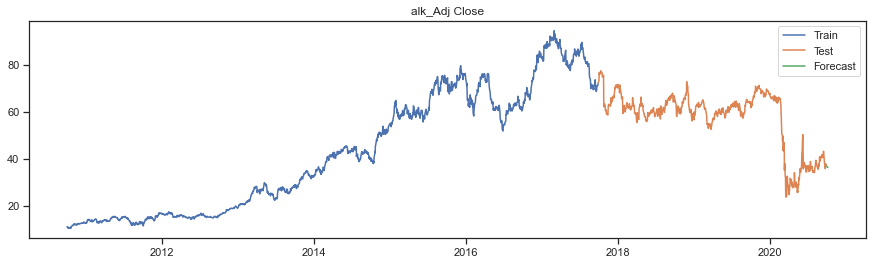

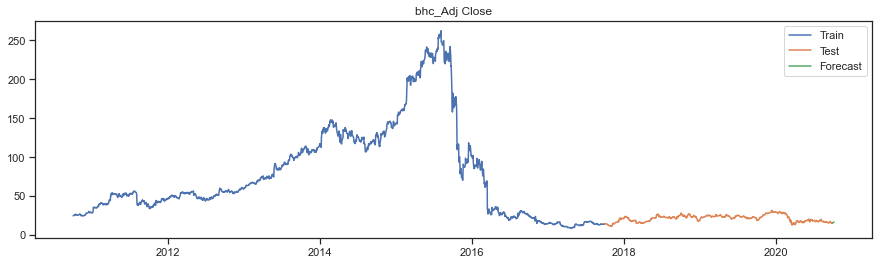

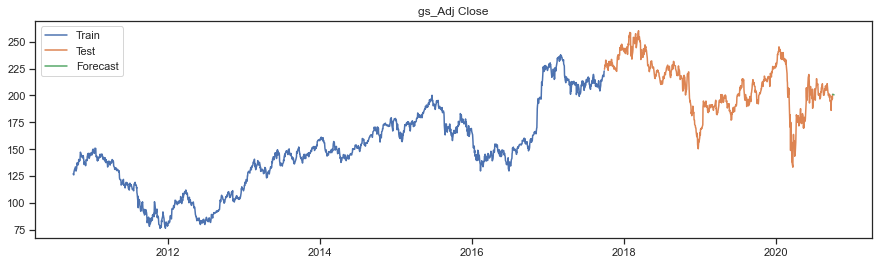

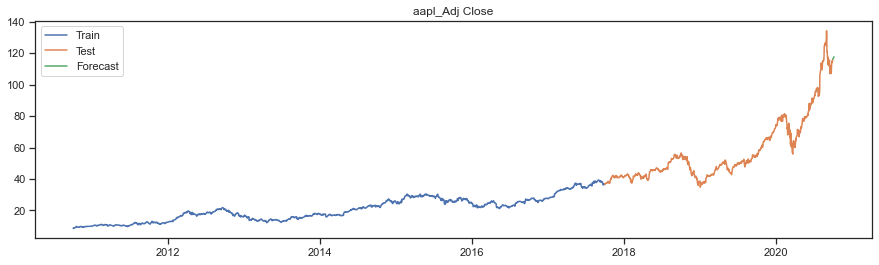

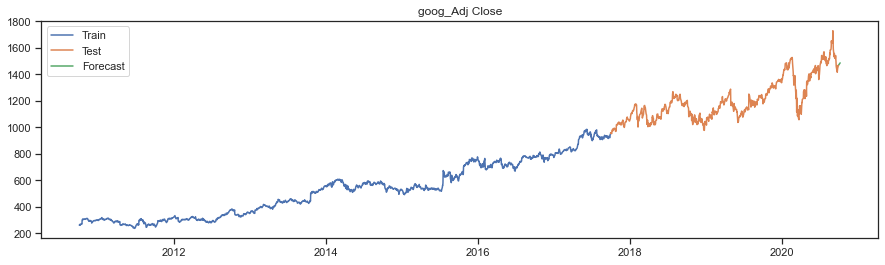

...

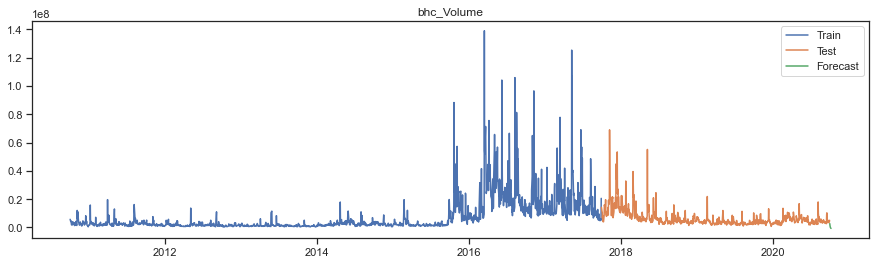

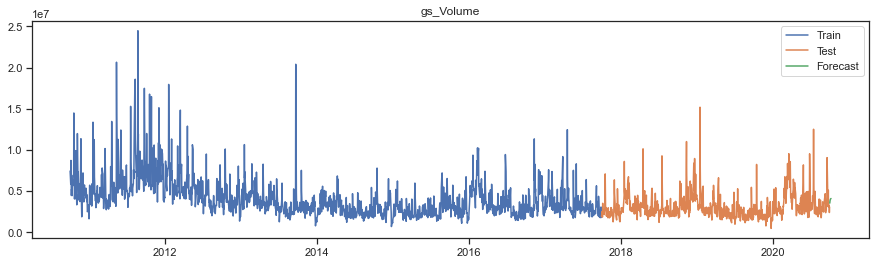

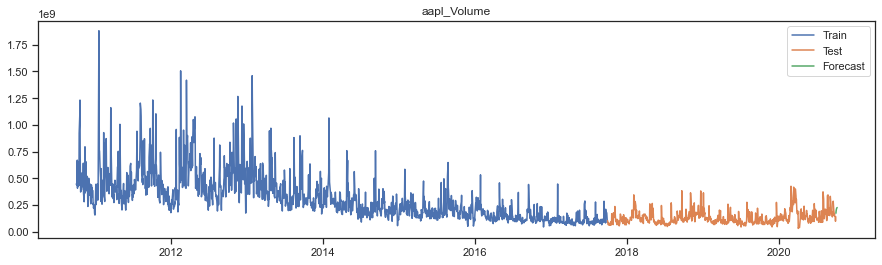

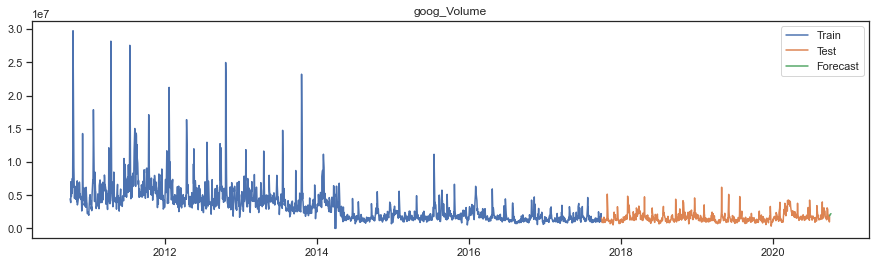

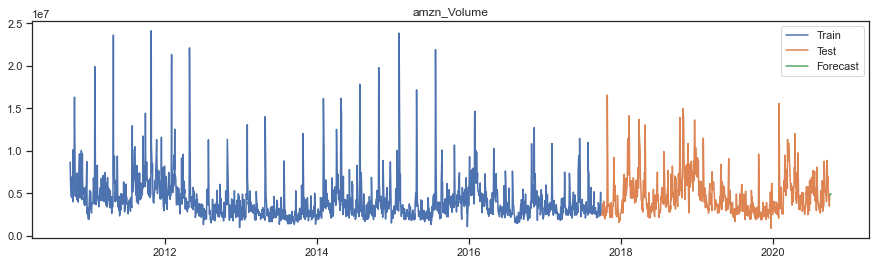

In [130]:
for col in price_prediction.columns:
    plt.figure(figsize=[15,4])
    plt.plot(price_prediction[col][:train_len],label='Train')
    plt.plot(price_prediction[col][train_len:],label='Test')
    plt.plot(week[col][:],label='Forecast')
    plt.legend(loc='best')
    plt.title(col)
    plt.show()

- Forecast value for next week shown in the Graphs, And we can predict the next price of every sector for a week. From that, we can choose the best companies and invest funds and will get good returns.

# 9. Creating Main Data-set

In [131]:
Main_stock_csv=pd.DataFrame()
Main_stock_csv=pd.concat([price_prediction,week])
Main_stock_csv.tail(7)

,alk_Adj Close,bhc_Adj Close,gs_Adj Close,aapl_Adj Close,goog_Adj Close,amzn_Adj Close,alk_Volume,bhc_Volume,gs_Volume,aapl_Volume,goog_Volume,amzn_Volume
Date,,,,,,,,,,,,
2020-10-01,36.600157,15.741051,201.005492,116.063382,1472.029510,3153.231022,2.240908e+06,2.724055e+06,3.540742e+06,1.742412e+08,1.890195e+06,4.772429e+06
2020-10-02,36.551742,15.933187,200.981271,116.322241,1474.427613,3158.144349,2.377733e+06,1.356030e+06,3.788820e+06,1.945328e+08,2.017587e+06,4.786812e+06
2020-10-03,36.491959,16.118663,200.922788,116.582418,1476.771217,3163.189781,2.437234e+06,5.333496e+05,3.926626e+06,2.076609e+08,2.100000e+06,4.834588e+06
2020-10-04,36.424994,16.299379,200.844109,116.842528,1479.063196,3168.266140,2.464163e+06,2.441843e+04,4.006092e+06,2.161775e+08,2.151993e+06,4.882855e+06
2020-10-05,36.353342,16.476748,200.753286,117.102249,1481.313264,3173.342548,2.477457e+06,-2.997417e+05,4.053191e+06,2.217080e+08,2.184108e+06,4.921966e+06
2020-10-06,36.278523,16.651760,200.655062,117.361624,1483.531183,3178.413927,2.485077e+06,-5.130138e+05,4.081554e+06,2.253019e+08,2.203478e+06,4.950821e+06
2020-10-07,36.201474,16.825090,200.552300,117.620794,1485.724826,3183.483391,2.490343e+06,-6.587641e+05,4.098690e+06,2.276415e+08,2.214760e+06,4.971019e+06


## 9.1 Now we have to save data into csv file

In [132]:
Main_stock_csv.to_csv('Main_stock.csv')

In [133]:
Main_stock_csv = pd.read_csv('Main_stock.csv')
Main_stock_csv.head()

,Date,alk_Adj Close,bhc_Adj Close,gs_Adj Close,aapl_Adj Close,goog_Adj Close,amzn_Adj Close,alk_Volume,bhc_Volume,gs_Volume,aapl_Volume,goog_Volume,amzn_Volume
0,2010-10-01,10.972344,24.757708,127.147858,8.719163,261.828613,153.710007,1663600.0,5778700.0,7439800.0,448142800.0,4466600.0,8683400.0
1,2010-10-04,10.703489,24.873083,126.175117,8.599421,260.199707,155.389999,1512400.0,4187200.0,5866700.0,435302000.0,3895400.0,5346500.0
2,2010-10-05,10.767396,25.286512,128.757706,8.917298,268.110046,160.869995,2567200.0,4610300.0,8724700.0,501967200.0,7040400.0,5620000.0
3,2010-10-06,10.743157,25.661484,129.850906,8.925013,266.177307,155.399994,1043600.0,4448900.0,6330600.0,670868800.0,5545200.0,6060800.0
4,2010-10-07,10.247319,25.574951,130.083435,8.925941,264.015411,156.270004,7682400.0,2453900.0,4471500.0,408399600.0,4809400.0,4622000.0
